## 3D Interactive Car with Plotly



Impressed by these kernels, I used these kernels and the plotly official documentation to create the following visualizations:

- Eric Bouteillon(@ebouteillon) : [Load a 3D car model](https://www.kaggle.com/ebouteillon/load-a-3d-car-model)
- Phung Hieu(@phunghieu) [A quick & simple EDA](https://www.kaggle.com/phunghieu/a-quick-simple-eda)

- [Plotly : Surface Triangulation in Python/v3](https://plot.ly/python/v3/surface-triangulation/)

I hope you all get good results.

In [2]:

import json
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

import plotly.figure_factory as FF
import plotly.graph_objs as go



def tri_indices(simplices):
    """
    params:
        simplices is a numpy array defining the simplices of the triangularization
        
    return:
        returns the lists of indices i, j, k
    """
    
    return ([triplet[c] for triplet in simplices] for c in range(3))

def plotly_trisurf(x, y, z, simplices, colormap=cm.RdBu, plot_edges=None):
    """
    x, y, z are lists of coordinates of the triangle vertices 
    simplices are the simplices that define the triangularization;
    simplices  is a numpy array of shape (no_triangles, 3)
    """

    points3D=np.vstack((x,y,z)).T
    tri_vertices=map(lambda index: points3D[index], simplices)
    zmean=[np.mean(tri[:,2]) for tri in tri_vertices ]
    min_zmean=np.min(zmean)
    max_zmean=np.max(zmean)
    facecolor=[map_z2color(zz,  
                           colormap, 
                           min_zmean, 
                           max_zmean) for zz in zmean]
    I,J,K=tri_indices(simplices)

    triangles=go.Mesh3d(x=x, 
                        y=y, 
                        z=z,
                        facecolor=facecolor,
                        i=I, 
                        j=J, 
                        k=K,
                        name='')

    if plot_edges is None: return [triangles]
    else:
        lists_coord=[[[T[k%3][c] for k in range(4)]+[ None]   for T in tri_vertices]  for c in range(3)]
        Xe, Ye, Ze = [reduce(lambda x,y: x+y, lists_coord[k]) for k in range(3)]

        lines=go.Scatter3d(x=Xe, 
                           y=Ye, 
                           z=Ze,
                           mode='lines',
                           line=dict(color='rgb(50,50,50)', 
                                     width=1.5))
        return [triangles, lines]

    
def map_z2color(zval, colormap, vmin, vmax):
    """
    map the normalized value zval to a corresponding color in the colormap
    """
    if vmin>vmax: 
        raise ValueError('incorrect relation between vmin and vmax')
        
    t=(zval-vmin)/float((vmax-vmin))#normalize val
    R, G, B, alpha=colormap(t)
    
    return 'rgb('+'{:d}'.format(int(R*255+0.5))+','+'{:d}'.format(int(G*255+0.5))+\
           ','+'{:d}'.format(int(B*255+0.5))+')'

In [3]:
# def plotly_Surface_Triangulation(axis=True)
axis=False
with open('/kaggle/input/pku-autonomous-driving/car_models_json/sikeda-jingrui.json') as json_file:
    
    data = json.load(json_file)
    vertices, triangles = np.array(data['vertices']), np.array(data['faces']) - 1
    
    x, y, z = vertices[:,0], vertices[:,2], -vertices[:,1]
    
    car_type = data['car_type']
    
    graph_data = plotly_trisurf(x,
                                y,
                                z,
                                triangles, 
                                colormap=cm.RdBu, 
                                plot_edges=None)
    if axis:

        # with axis
        axis = dict(
            showbackground=True,
            backgroundcolor="rgb(230, 230,230)",
            gridcolor="rgb(255, 255, 255)",
            zerolinecolor="rgb(255, 255, 255)",
        )
        
        scene=dict(
            xaxis=dict(axis), 
            yaxis=dict(axis), 
            zaxis=dict(axis),
#                 aspectratio=dict( x=1, y=2, z=0.5),
#                 camera=dict(eye=dict(x=1.25, y=1.25, z= 1.25))
         )

        

#         fig = go.Figure(data=graph_data, 
#                         layout=layout,
#                        )
#         fig.update_layout(scene_aspectmode="data")



    else:
        # with no axis
        noaxis=dict(
            showbackground=False,
            showline=False,
            zeroline=False,
            showgrid=False,
            showticklabels=False,
            title=''
        )
        
        scene=dict(
            xaxis=dict(noaxis), 
            yaxis=dict(noaxis), 
            zaxis=dict(noaxis),

             )
        
    layout = go.Layout(
        title= dict(
            text=car_type,
            x=0.6,
            y=0.95,
            font=dict(
                family="Arial",
                size=20,
                color='#000000'
                )
            ),
        hoverlabel=dict(
            bgcolor="rgba(58, 71, 80, 0.1)",
            font_size=16,
            font_family="Rockwell"
            ),
        margin=dict(
            l=0,
            b=0,
            r=0,
            t=0,
        ),
        width=900, 
        height=500,

        paper_bgcolor='snow',
        scene=scene,
        scene_aspectmode="data"

)

        
    fig = go.Figure(data=graph_data, 
                    layout=layout)


    fig.show()

    


aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, rebeccapurple, saddlebrown, salmon,
            sandybrown, seagreen, seashell, sienna, silver,
            skyblue, slateblue, slategray, slategrey, snow,
            springgreen, steelblue, tan, teal, thistle, tomato,
            turquoise, violet, wheat, white, whitesmoke,
            yellow, yellowgreen

In [4]:
from pprint import pprint

pprint(data.keys())

dict_keys(['car_type', 'vertices', 'faces'])


In [5]:
import shutil

zip_name = "car_models_json"

shutil.make_archive(zip_name, "zip", "/kaggle/input/pku-autonomous-driving/car_models_json")

'/kaggle/working/car_models_json.zip'

In [6]:

colors = plt.colormaps()

mpl version: 3.0.3,
number of cmaps: 164


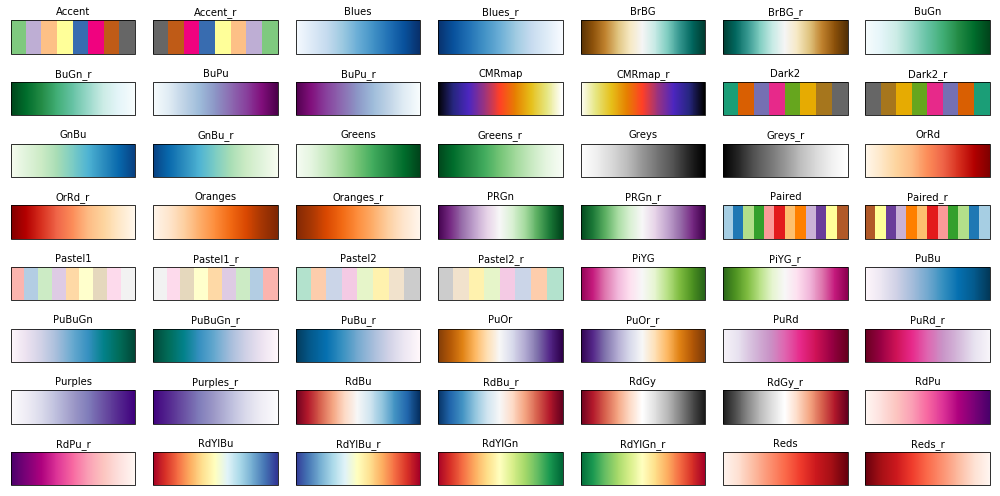

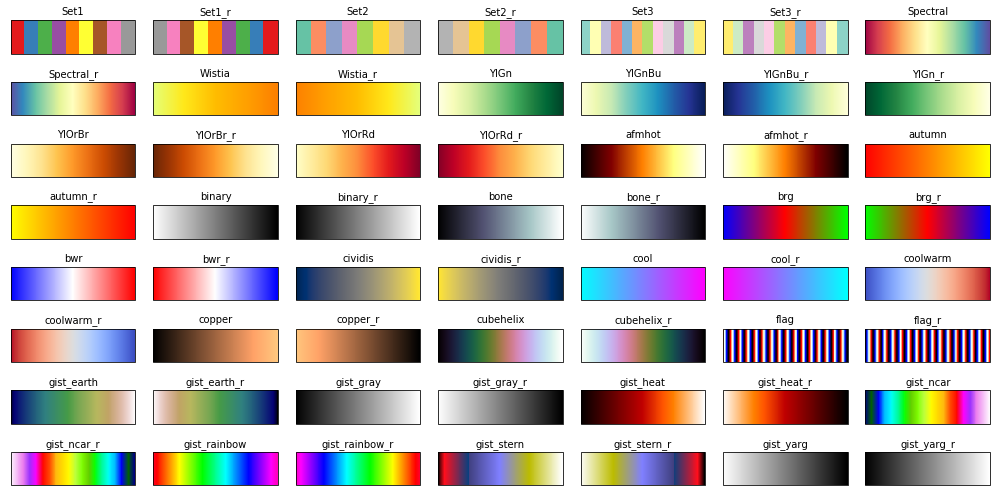

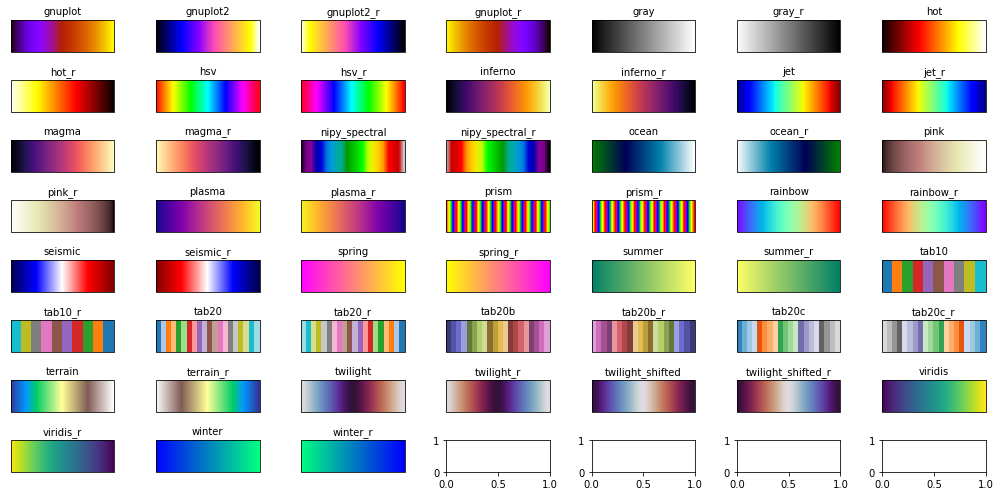

In [7]:
import matplotlib as mpl
import matplotlib.pyplot as plt

def plot_all_cmaps():
    
    N_ROWS, N_COLS = 8, 7 # 13, 13 <-- for all in one figure 
    HEIGHT, WIDTH = 7, 14

    cmap_ids = plt.colormaps()
    n_cmaps = len(cmap_ids)
    
    print(f'mpl version: {mpl.__version__},\nnumber of cmaps: {n_cmaps}')
    
    index = 0
    
    while index < n_cmaps:
        fig, axes = plt.subplots(N_ROWS, 
                                 N_COLS, 
                                 figsize=(WIDTH, 
                                          HEIGHT))
        for row in range(N_ROWS):
            for col in range(N_COLS):
                ax = axes[row, col]
                cmap_id = cmap_ids[index]
                cmap = plt.get_cmap(cmap_id)
                mpl.colorbar.ColorbarBase(ax, 
                                          cmap=cmap,
                                          orientation='horizontal')
                
                ax.set_title(f"{cmap_id}", 
                             fontsize=10)
                ax.tick_params(left=False, 
                               right=False, 
                               labelleft=False,
                               labelbottom=False, 
                               bottom=False)
                
                last_iteration = index == n_cmaps-1
                if (row==N_ROWS-1 and col==N_COLS-1) or last_iteration:
                    plt.tight_layout()
                    #plt.savefig('colormaps'+str(index)+'.png')
                    plt.show()
                    if last_iteration: return
                index += 1

plot_all_cmaps()

In [8]:
import glob
pprint(glob.glob("/kaggle/input/pku-autonomous-driving/car_models_json/*"))

['/kaggle/input/pku-autonomous-driving/car_models_json/baoma-X5.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/aodi-Q7-SUV.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/yingfeinidi-SUV.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/019-SUV.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/kaidilake-CTS.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/guangqi-chuanqi-GS4-2015.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/biaozhi-408.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/dongfeng-fengguang-S560.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/dongfeng-yulong-naruijie.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/lingmu-SX4-2012.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/changan-CS35-2012.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/biaozhi-liangxiang.json',
 '/kaggle/input/pku-autonomous-driving/car_models_json/sik

In [9]:
import os
car_models_list = next(os.walk("/kaggle/input/pku-autonomous-driving/car_models_json"))[2]

car_models_list = [i.replace(".json", "") for i in car_models_list]

car_models_list

['baoma-X5',
 'aodi-Q7-SUV',
 'yingfeinidi-SUV',
 '019-SUV',
 'kaidilake-CTS',
 'guangqi-chuanqi-GS4-2015',
 'biaozhi-408',
 'dongfeng-fengguang-S560',
 'dongfeng-yulong-naruijie',
 'lingmu-SX4-2012',
 'changan-CS35-2012',
 'biaozhi-liangxiang',
 'sikeda-jingrui',
 'fengtian-MPV',
 'qiya',
 'biyadi-2x-F0',
 'lingmu-aotuo-2009',
 'benchi-SUR',
 'jilixiongmao-2015',
 'yiqi-benteng-b50',
 'dazhongmaiteng',
 'jipu-3',
 'qirui-ruihu',
 'bieke-kaiyue',
 'oubao',
 'fengtian-SUV-gai',
 'changan-cs5',
 'jili-boyue',
 'aodi-a6',
 'changcheng-H6-2016',
 'bieke-yinglang-XT',
 'xiandai-suonata',
 'bentian-fengfan',
 'Skoda_Fabia-2011',
 'baoshijie-paoche',
 'dazhong',
 'biaozhi-508',
 'changanbenben',
 '036-CAR01',
 'fengtian-liangxiang',
 'MG-GT-2015',
 'rongwei-750',
 'mazida-6-2015',
 '037-CAR02',
 'sikeda-SUV',
 'dongfeng-xuetielong-C6',
 'fengtian-puladuo-06',
 'rongwei-RX5',
 'biyadi-tang',
 'dazhong-SUV',
 'linken-SUV',
 'baojun-510',
 'jianghuai-ruifeng-S3',
 'dongfeng-DS5',
 'bieke',
 'bao

In [10]:
['baoma-X5',
 'aodi-Q7-SUV',
 'yingfeinidi-SUV',
 '019-SUV',
 'kaidilake-CTS',
 'guangqi-chuanqi-GS4-2015',
 'biaozhi-408',
 'dongfeng-fengguang-S560',
 'dongfeng-yulong-naruijie',
 'lingmu-SX4-2012',
 'changan-CS35-2012',
 'biaozhi-liangxiang',
 'sikeda-jingrui',
 'fengtian-MPV',
 'qiya',
 'biyadi-2x-F0',
 'lingmu-aotuo-2009',
 'benchi-SUR',
 'jilixiongmao-2015',
 'yiqi-benteng-b50',
 'dazhongmaiteng',
 'jipu-3',
 'qirui-ruihu',
 'bieke-kaiyue',
 'oubao',
 'fengtian-SUV-gai',
 'changan-cs5',
 'jili-boyue',
 'aodi-a6',
 'changcheng-H6-2016',
 'bieke-yinglang-XT',
 'xiandai-suonata',
 'bentian-fengfan',
 'Skoda_Fabia-2011',
 'baoshijie-paoche',
 'dazhong',
 'biaozhi-508',
 'changanbenben',
 '036-CAR01',
 'fengtian-liangxiang',
 'MG-GT-2015',
 'rongwei-750',
 'mazida-6-2015',
 '037-CAR02',
 'sikeda-SUV',
 'dongfeng-xuetielong-C6',
 'fengtian-puladuo-06',
 'rongwei-RX5',
 'biyadi-tang',
 'dazhong-SUV',
 'linken-SUV',
 'baojun-510',
 'jianghuai-ruifeng-S3',
 'dongfeng-DS5',
 'bieke',
 'baoshijie-kayan',
 'fute',
 'dihao-EV',
 'fengtian-weichi-2006',
 'leikesasi',
 'xiandai-i25-2016',
 'supai-2016',
 'benchi-ML500',
 'biyadi-F3',
 'haima-3',
 'sanling-oulande',
 'feiyate',
 'dongfeng-fengxing-SX6',
 'lufeng-X8',
 'biaozhi-3008',
 'baoma-530',
 'yingfeinidi-qx80',
 'benchi-GLK-300',
 'lingmu-swift',
 'beiqi-huansu-H3',
 'baoma-330',
 'baojun-310-2017',
 'dongnan-V3-lingyue-2011',
 'biyadi-qin']

['baoma-X5',
 'aodi-Q7-SUV',
 'yingfeinidi-SUV',
 '019-SUV',
 'kaidilake-CTS',
 'guangqi-chuanqi-GS4-2015',
 'biaozhi-408',
 'dongfeng-fengguang-S560',
 'dongfeng-yulong-naruijie',
 'lingmu-SX4-2012',
 'changan-CS35-2012',
 'biaozhi-liangxiang',
 'sikeda-jingrui',
 'fengtian-MPV',
 'qiya',
 'biyadi-2x-F0',
 'lingmu-aotuo-2009',
 'benchi-SUR',
 'jilixiongmao-2015',
 'yiqi-benteng-b50',
 'dazhongmaiteng',
 'jipu-3',
 'qirui-ruihu',
 'bieke-kaiyue',
 'oubao',
 'fengtian-SUV-gai',
 'changan-cs5',
 'jili-boyue',
 'aodi-a6',
 'changcheng-H6-2016',
 'bieke-yinglang-XT',
 'xiandai-suonata',
 'bentian-fengfan',
 'Skoda_Fabia-2011',
 'baoshijie-paoche',
 'dazhong',
 'biaozhi-508',
 'changanbenben',
 '036-CAR01',
 'fengtian-liangxiang',
 'MG-GT-2015',
 'rongwei-750',
 'mazida-6-2015',
 '037-CAR02',
 'sikeda-SUV',
 'dongfeng-xuetielong-C6',
 'fengtian-puladuo-06',
 'rongwei-RX5',
 'biyadi-tang',
 'dazhong-SUV',
 'linken-SUV',
 'baojun-510',
 'jianghuai-ruifeng-S3',
 'dongfeng-DS5',
 'bieke',
 'bao

In [11]:
!pip install plyfile

     |████████████████████████████████| 40kB 3.5MB/s  eta 0:00:01
     |████████████████████████████████| 14.8MB 14.3MB/s eta 0:00:01
ERROR: allennlp 0.9.0 requires flaky, which is not installed.
ERROR: allennlp 0.9.0 requires responses>=0.7, which is not installed.
ERROR: tsfresh 0.12.0 has requirement pandas<=0.23.4,>=0.20.3, but you'll have pandas 0.25.2 which is incompatible.
ERROR: tensorflow-probability 0.8.0 has requirement cloudpickle==1.1.1, but you'll have cloudpickle 1.2.2 which is incompatible.
ERROR: mizani 0.6.0 has requirement matplotlib>=3.1.1, but you'll have matplotlib 3.0.3 which is incompatible.
ERROR: kmeans-smote 0.1.2 has requirement imbalanced-learn<0.5,>=0.4.0, but you'll have imbalanced-learn 0.5.0 which is incompatible.
ERROR: kmeans-smote 0.1.2 has requirement numpy<1.16,>=1.13, but you'll have numpy 1.19.5 which is incompatible.
ERROR: kmeans-smote 0.1.2 has requirement scikit-learn<0.21,>=0.19.0, but you'll have scikit-learn 0.21.3 which is incompatible.
E

In [12]:
import urllib.request as urllib2

In [33]:
from plyfile import PlyData, PlyElement


req = urllib2.Request('https://people.sc.fsu.edu/~jburkardt/data/ply/skull.ply')
opener = urllib2.build_opener()
f = opener.open(req)
plydata = PlyData.read(f)

In [34]:
plydata.elements

(PlyElement('vertex', (PlyProperty('x', 'float'), PlyProperty('y', 'float'), PlyProperty('z', 'float'), PlyProperty('red', 'uchar'), PlyProperty('green', 'uchar'), PlyProperty('blue', 'uchar')), count=133009, comments=[]),
 PlyElement('face', (PlyListProperty('vertex_indices', 'uchar', 'int'),), count=248999, comments=[]))

In [56]:
nr_points = plydata.elements[0].count
nr_faces = plydata.elements[1].count
points = np.array([plydata['vertex'][k] for k in range(nr_points)])

In [57]:
len(points)

133009

In [58]:
from operator import itemgetter
list(map(itemgetter(0, 1, 2), points[:20]))

[(-0.0, -0.0, -0.0),
 (-34.81151, -117.87041, 63.747543),
 (-35.032043, -117.1509, 64.28418),
 (-34.425644, -117.56771, 64.17799),
 (-34.103275, -118.130844, 63.940544),
 (-34.569893, -116.8682, 64.41063),
 (-33.89257, -117.61104, 63.931767),
 (-34.138874, -117.10203, 64.09167),
 (-35.24281, -116.403915, 64.59386),
 (-33.457767, -117.83606, 63.535133),
 (-33.73894, -117.08395, 63.67015),
 (-34.2504, -116.53077, 64.078735),
 (-34.35377, -115.92619, 63.989964),
 (-33.27738, -117.20116, 63.190285),
 (-33.699234, -116.40548, 63.452465),
 (-33.913807, -115.65382, 63.397316),
 (-35.02093, -115.524185, 64.34093),
 (-32.983162, -117.88584, 63.11632),
 (-33.10921, -116.664825, 62.788734),
 (-33.43706, -116.003174, 62.865578)]

In [59]:



if len(points[0]) > 3:
    points = list(map(itemgetter(0, 1, 2), points))
    
x,y,z = zip(*points)
faces = [plydata['face'][k][0] for k in range(nr_faces)]

graph_data = plotly_trisurf(x,y,z, faces, colormap=cm.RdBu, plot_edges=None)


if axis:

    # with axis
    axis = dict(
        showbackground=True,
        backgroundcolor="rgb(230, 230,230)",
        gridcolor="rgb(255, 255, 255)",
        zerolinecolor="rgb(255, 255, 255)",
    )

    scene=dict(
        xaxis=dict(axis), 
        yaxis=dict(axis), 
        zaxis=dict(axis),
        aspectratio=dict( x=0, y=0, z=0.5),
        camera=dict(eye=dict(x=4.25, y=1.25, z= 1.25))
     )





else:
    # with no axis
    noaxis=dict(
        showbackground=False,
        showline=False,
        zeroline=False,
        showgrid=False,
        showticklabels=False,
        title=''
    )

    scene=dict(
        xaxis=dict(noaxis), 
        yaxis=dict(noaxis), 
        zaxis=dict(noaxis),

         )

layout = go.Layout(
    title= dict(
        text="Ant",
        x=0.6,
        y=0.95,
        font=dict(
            family="Arial",
            size=20,
            color='#000000'
            )
        ),
    hoverlabel=dict(
        bgcolor="rgba(58, 71, 80, 0.1)",
        font_size=16,
        font_family="Rockwell"
        ),
    margin=dict(
        l=0,
        b=0,
        r=0,
        t=0,
    ),
    width=900, 
    height=400,

    paper_bgcolor='snow',
    scene=scene,
    scene_aspectmode="data"

)


fig = go.Figure(data=graph_data, 
                layout=layout)



fig.show()

    


In [28]:
# import subprocess

# myurl = 'https://people.sc.fsu.edu/~jburkardt/data/ply'
# subprocess.call(["wget", "-r", "rb" "files", "ply", myurl])

In [123]:
# next(os.walk("/kaggle/working/people.sc.fsu.edu/~jburkardt/data/ply"))[2]

['symphysis.ply',
 'tetrahedron.ply',
 'scissors.ply',
 'street_lamp.ply',
 'cow.binary.ply',
 'walkman.ply',
 'helix.ply',
 'ellell.ply',
 'sphere.ply',
 'trashcan.ply',
 'part.ply',
 'tennis_shoe.ply',
 'airplane.ply',
 'apple.ply',
 'ketchup.ply',
 'steeringweel.ply',
 'cube.ply',
 'mug.ply',
 'hammerhead.ply',
 'turbine.ply',
 'teapot.ply',
 'ant.ply',
 'pickup_big.ply',
 'head2.ply',
 'shark.ply',
 'icosahedron.ply',
 'balance.ply',
 'big_spider.ply',
 'saratoga.ply',
 'pump.ply',
 'cow.ply',
 'chopper.ply',
 'canstick.ply',
 'footbones.ply',
 'sandal.ply',
 'skull.ply',
 'galleon.ply',
 'urn2.ply',
 'head1.ply',
 'tommygun.ply',
 'big_porsche.ply',
 'f16.ply',
 'dodecahedron.ply',
 'pyramid.ply',
 'fracttree.ply',
 'kerolamp.ply',
 'big_atc.ply',
 'dolphins.ply',
 'weathervane.ply',
 'beethoven.ply',
 'hind.ply',
 'big_dodge.ply',
 'dart.ply',
 'egret.ply',
 'stratocaster.ply',
 'pumpa_tb.ply',
 'octahedron.ply']

In [ ]:
ply_files = ['symphysis.ply',
 'tetrahedron.ply',
 'scissors.ply',
 'street_lamp.ply',
 'cow.binary.ply',
 'walkman.ply',
 'helix.ply',
 'ellell.ply',
 'sphere.ply',
 'trashcan.ply',
 'part.ply',
 'tennis_shoe.ply',
 'airplane.ply',
 'apple.ply',
 'ketchup.ply',
 'steeringweel.ply',
 'cube.ply',
 'mug.ply',
 'hammerhead.ply',
 'turbine.ply',
 'teapot.ply',
 'ant.ply',
 'pickup_big.ply',
 'head2.ply',
 'shark.ply',
 'icosahedron.ply',
 'balance.ply',
 'big_spider.ply',
 'saratoga.ply',
 'pump.ply',
 'cow.ply',
 'chopper.ply',
 'canstick.ply',
 'footbones.ply',
 'sandal.ply',
 'skull.ply',
 'galleon.ply',
 'urn2.ply',
 'head1.ply',
 'tommygun.ply',
 'big_porsche.ply',
 'f16.ply',
 'dodecahedron.ply',
 'pyramid.ply',
 'fracttree.ply',
 'kerolamp.ply',
 'big_atc.ply',
 'dolphins.ply',
 'weathervane.ply',
 'beethoven.ply',
 'hind.ply',
 'big_dodge.ply',
 'dart.ply',
 'egret.ply',
 'stratocaster.ply',
 'pumpa_tb.ply',
 'octahedron.ply']

ply_file_names = [name.replace(".ply", "") for i in ply_files]

In [122]:

    
my_dir = "/kaggle/working/people.sc.fsu.edu/~jburkardt/data/ply"# enter the dir name
for fname in os.listdir(my_dir):
    if fname.endswith(".html"):
        os.remove(os.path.join(my_dir, fname))

In [125]:
zip_name = "ply_data"

shutil.make_archive(zip_name, "zip", my_dir)

'/kaggle/working/ply_data.zip'

In [126]:
shutil.rmtree("/kaggle/working/people.sc.fsu.edu")

In [ ]:

#     fig.add_shape(
#         # Line with reference to the plot
#             type="line",
#             xref="paper",
#             yref="paper",
#             x0=0,
#             y0=1.0,
#             x1=1.0,
#             y1=1.0,
#             line=dict(
#                 color="black",
#                 width=4,
#             )
#         )

#     fig.add_shape(
#             # Line with reference to the plot
#                 type="line",
#                 xref="paper",
#                 yref="paper",
#                 x0=1.0,
#                 y0=1.0,
#                 x1=1.0,
#                 y1=0,
#                 line=dict(
#                     color="teal",
#                     width=6,
#                 )
#             )